- transformation -Done-
- outliers -Done -
- categoricals -DONE-
- genres ( split ) -Done-
- artist (split ) -Done-
- drop the nulls -Done-
- scaling

# Notes ["Album_isTop_1810","is_local"] all False

In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from scipy.stats import boxcox
import ast
sns.set()
warnings.filterwarnings(action='ignore')

In [2]:
os.listdir()

['.ipynb_checkpoints',
 'abdelrhman&nour.csv',
 'clusterData.csv',
 'Clustering.ipynb',
 'Data.zip',
 'Expanded_DF.csv',
 'Popularity_Spotify2 (1).csv',
 'Prepared Song Popularity.csv',
 'PreprocessedDF.csv',
 'PreprocessedDF_WithoutOutliers.csv',
 'Preprocessing.ipynb',
 'SongPopularity.csv']

In [3]:
df=pd.read_csv("Prepared Song Popularity.csv")

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6191 entries, 0 to 6190
Data columns (total 44 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Unnamed: 0                             6191 non-null   int64  
 1   Song                                   6191 non-null   object 
 2   Album                                  6191 non-null   object 
 3   Artist Names                           6191 non-null   object 
 4   Hot100 Rank                            6191 non-null   int64  
 5   Song Length(ms)                        6191 non-null   int64  
 6   Spotify Link                           6191 non-null   object 
 7   Song Image                             6191 non-null   object 
 8   Spotify URI                            6191 non-null   object 
 9   Popularity                             6191 non-null   int64  
 10  Acousticness                           6191 non-null   float64
 11  Danc

In [5]:
df.isnull().sum()

Unnamed: 0                                 0
Song                                       0
Album                                      0
Artist Names                               0
Hot100 Rank                                0
Song Length(ms)                            0
Spotify Link                               0
Song Image                                 0
Spotify URI                                0
Popularity                                 0
Acousticness                               0
Danceability                               0
Energy                                     0
Instrumentalness                           0
Liveness                                   0
Loudness                                   0
Speechiness                                0
Tempo                                      0
Valence                                    0
Key                                        0
Mode                                       0
Time Signature                             0
number of 

In [6]:
df.describe()

,Unnamed: 0,Hot100 Rank,Song Length(ms),Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,...,number of words of the song name,number of characters of the song name,num_of_song_avaliable_markets,isItCatchy,Hot100 Ranking Year,number of song image details,Genres count,Weight,total weight of genres,Generes Clusters
count,6191.00000,6191.000000,6.191000e+03,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,...,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,6191.000000,6.191000e+03,6191.000000
mean,3095.00000,48.320627,2.246265e+05,54.117913,0.300063,0.617710,0.596881,0.045992,0.180755,-8.718824,...,4.193668,21.574221,156.318850,0.874657,1995.975933,11.724600,4.765304,1291.610079,1.694101e+04,9.657083
std,1787.33209,29.185349,6.436037e+04,21.511330,0.291133,0.156799,0.205486,0.170713,0.150009,3.774887,...,2.927691,16.144939,61.723358,0.331134,18.255277,2.594248,6.399237,1820.832670,9.501383e+04,5.812568
min,0.00000,1.000000,5.180000e+04,0.000000,0.000004,0.000000,0.012000,0.000000,0.015000,-37.841000,...,1.000000,1.000000,0.000000,0.000000,1946.000000,3.000000,0.000000,0.000000,0.000000e+00,0.000000
25%,1547.50000,23.000000,1.817595e+05,42.000000,0.049250,0.520500,0.455500,0.000000,0.087200,-11.122500,...,2.000000,11.000000,180.000000,1.000000,1982.000000,11.000000,2.000000,177.000000,3.420000e+02,5.000000
50%,3095.00000,47.000000,2.207340e+05,58.000000,0.195000,0.633000,0.615000,0.000004,0.123000,-8.128000,...,3.000000,17.000000,184.000000,1.000000,1999.000000,12.000000,4.000000,784.000000,3.064000e+03,9.000000
75%,4642.50000,74.000000,2.571130e+05,70.000000,0.511500,0.728000,0.758000,0.000523,0.232000,-5.787500,...,5.000000,27.000000,185.000000,1.000000,2011.000000,13.000000,6.000000,1743.000000,9.436000e+03,16.000000
max,6190.00000,100.000000,1.561133e+06,94.000000,0.995000,0.988000,0.997000,0.972000,0.985000,-0.810000,...,36.000000,163.000000,185.000000,1.000000,2023.000000,19.000000,84.000000,17887.000000,1.502508e+06,19.000000


In [7]:
#df=df.dropna(axis=0)

In [8]:
df.head(2)

,Unnamed: 0,Song,Album,Artist Names,Hot100 Rank,Song Length(ms),Spotify Link,Song Image,Spotify URI,Popularity,...,Hot100 Ranking Year,Decade,Season,number of song image details,Artist(s) Genres,Genres count,Weight,total weight of genres,Album_isTop_1810,Generes Clusters
0,0,I Need You,I Need You,['LeAnn Rimes'],44,229826,https://open.spotify.com/track/046MBhhgQJJghnb...,https://i.scdn.co/image/ab67616d00001e025cf523...,spotify:track:046MBhhgQJJghnbgZCkaAR,62,...,2001,new millennium,Winter,14,"{' country', 'country dawn', ' contemporary co...",4,478,1912,False,0
1,1,Sweet Lady,Tyrese,['Tyrese'],43,290600,https://open.spotify.com/track/1Dx8rIZaXzZPvUQ...,https://i.scdn.co/image/ab67616d00001e0283422e...,spotify:track:1Dx8rIZaXzZPvUQRF2j9hB,63,...,1999,Nighnties,Summer,10,"{' contemporary r&b', ' urban contemporary', '...",4,1718,6872,False,7


In [9]:
df["Album Release Date"]=pd.to_datetime(df["Album Release Date"])
df["day"]=df["Album Release Date"].dt.day
df["month"]=df["Album Release Date"].dt.month
df["year"]=df["Album Release Date"].dt.year

In [10]:
for (i,j) in zip(df.iloc[0],df.iloc[0].index):
    print(j ,"--------",i)

Unnamed: 0 -------- 0
Song -------- I Need You
Album -------- I Need You
Artist Names -------- ['LeAnn Rimes']
Hot100 Rank -------- 44
Song Length(ms) -------- 229826
Spotify Link -------- https://open.spotify.com/track/046MBhhgQJJghnbgZCkaAR
Song Image -------- https://i.scdn.co/image/ab67616d00001e025cf523cc3dd38a682bf9cd7e
Spotify URI -------- spotify:track:046MBhhgQJJghnbgZCkaAR
Popularity -------- 62
Acousticness -------- 0.02
Danceability -------- 0.478
Energy -------- 0.736
Instrumentalness -------- 9.58e-05
Liveness -------- 0.118
Loudness -------- -7.124
Speechiness -------- 0.0367
Tempo -------- 144.705
Valence -------- 0.564
Key -------- 7
Mode -------- 1
Time Signature -------- 4
number of words of the song name -------- 3
number of characters of the song name -------- 10
is_local -------- False
num_of_song_avaliable_markets -------- 185
Duration Category -------- average_time
has_Potential -------- False
is_colorful -------- True
color_values -------- [(array([27, 27, 27],

In [11]:
categoricals=["isItCatchy","is_colorful","has_Potential","fromTop1000Artist","Mode","Decade","Season","Duration Category","Generes Clusters","Album_isTop_1810"]

In [50]:
categoricals

['isItCatchy',
 'is_colorful',
 'has_Potential',
 'fromTop1000Artist',
 'Mode',
 'Decade',
 'Season',
 'Duration Category',
 'Generes Clusters',
 'Album_isTop_1810']

In [12]:
non_object_cols = df.select_dtypes(exclude=['object']).columns
non_object_cols=non_object_cols.drop(["Unnamed: 0","isItCatchy","is_local","is_colorful","has_Potential","Album_isTop_1810","fromTop1000Artist","Mode","Generes Clusters","Album Release Date"])
non_object_cols

Index(['Hot100 Rank', 'Song Length(ms)', 'Popularity', 'Acousticness',
       'Danceability', 'Energy', 'Instrumentalness', 'Liveness', 'Loudness',
       'Speechiness', 'Tempo', 'Valence', 'Key', 'Time Signature',
       'number of words of the song name',
       'number of characters of the song name',
       'num_of_song_avaliable_markets', 'Hot100 Ranking Year',
       'number of song image details', 'Genres count', 'Weight',
       'total weight of genres', 'day', 'month', 'year'],
      dtype='object')

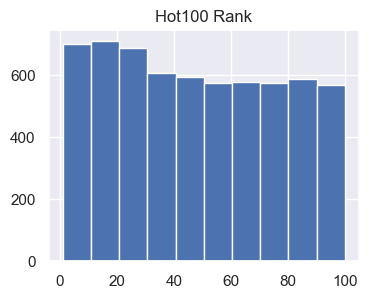

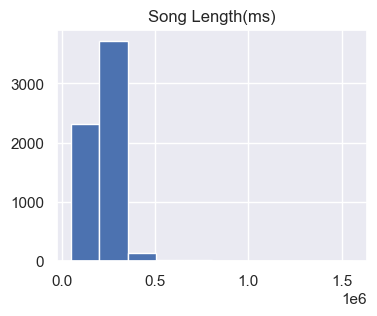

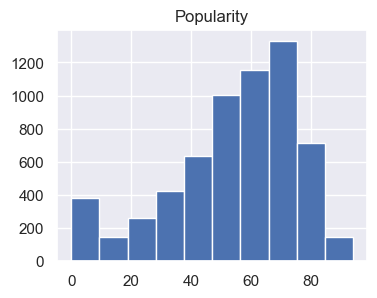

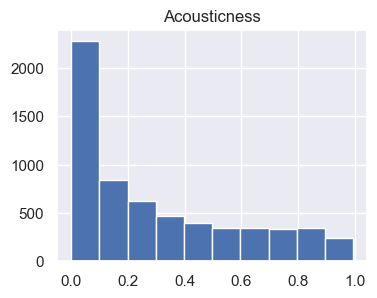

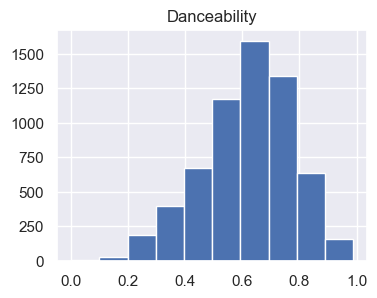

...

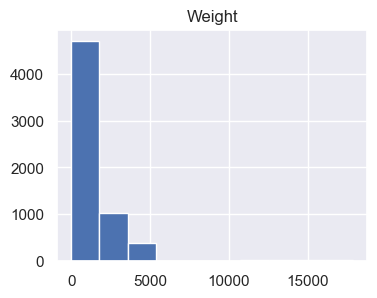

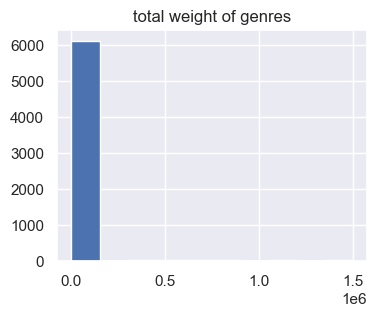

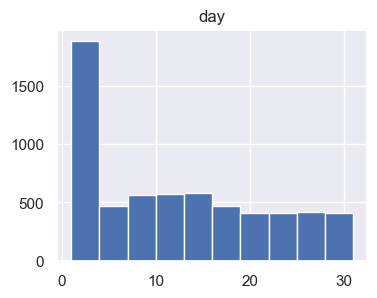

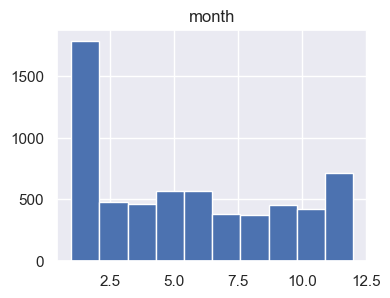

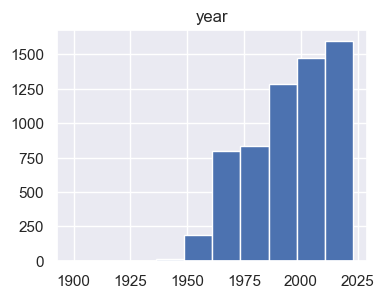

In [13]:
for col in non_object_cols:
    fig = plt.figure(figsize=(4,3))
    plt.title(f"{col}")
    df[col].hist()

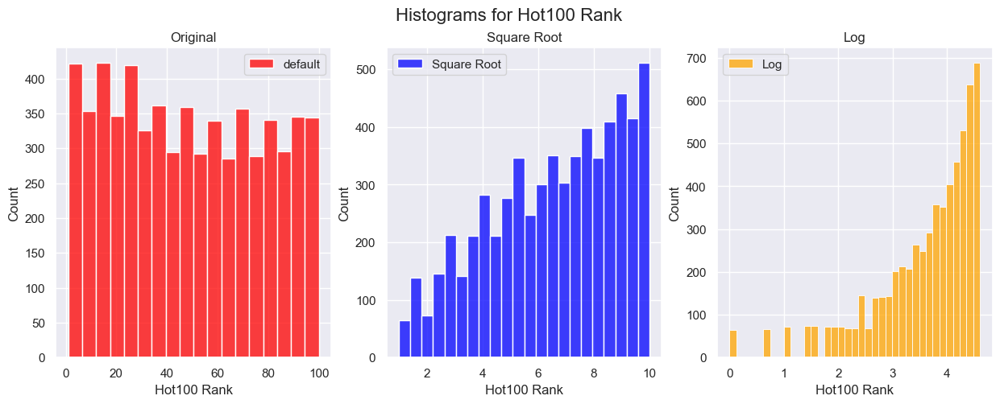

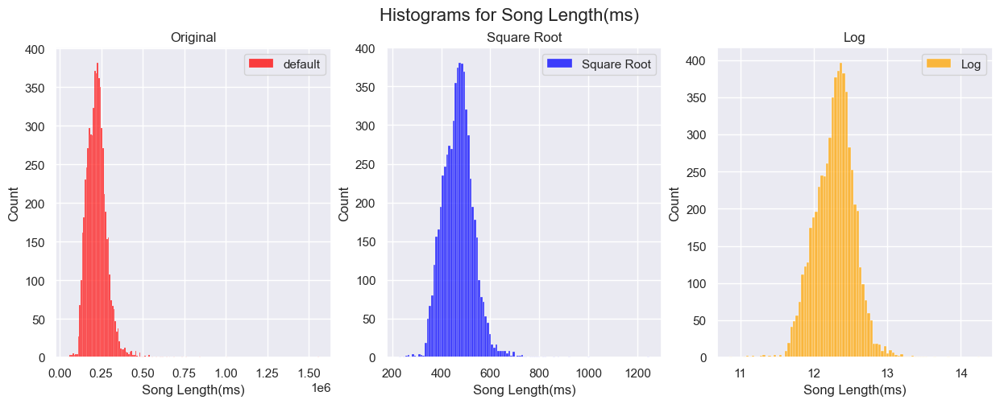

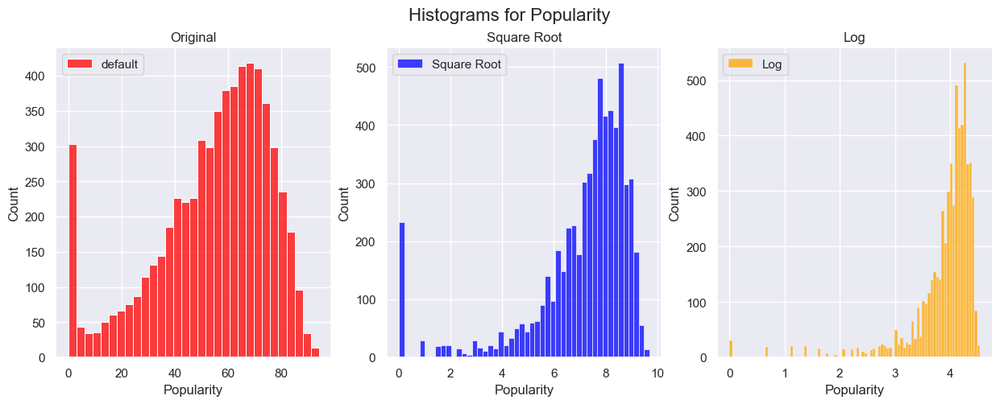

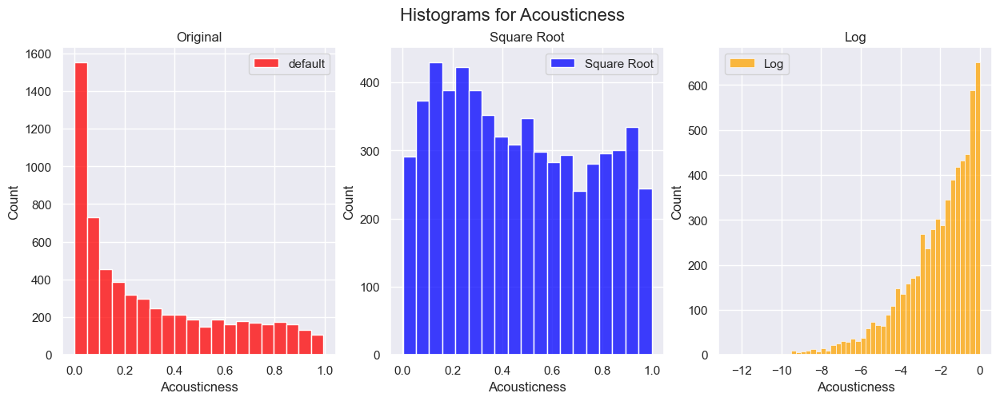

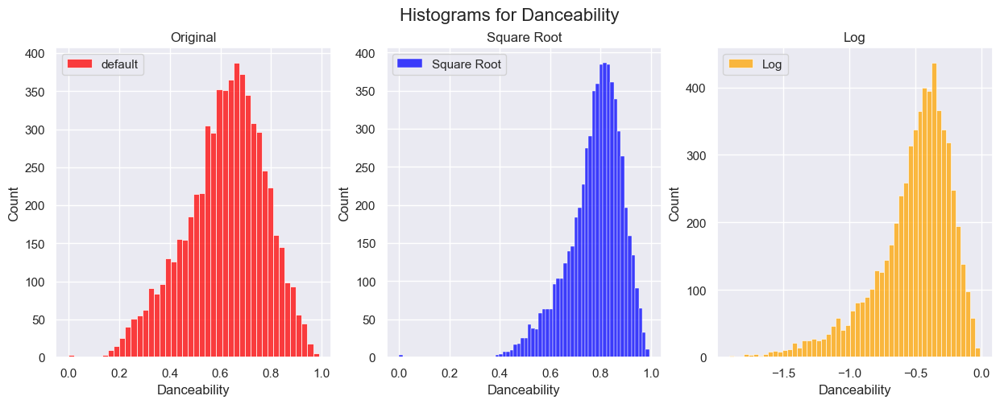

...

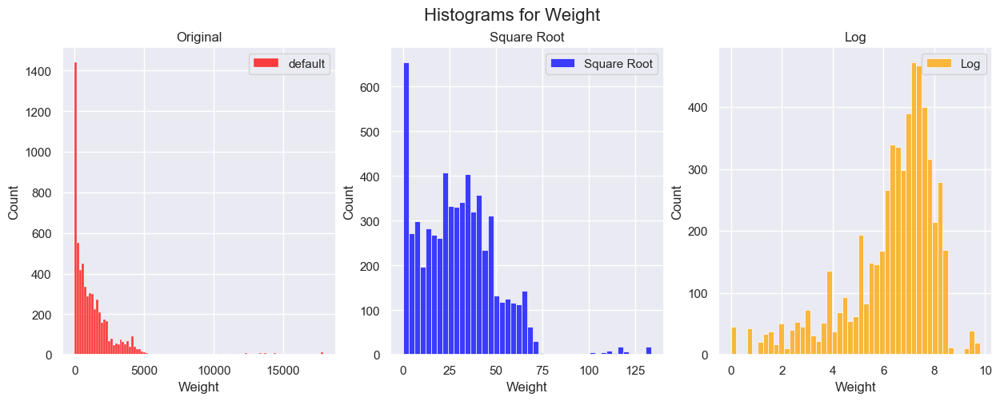

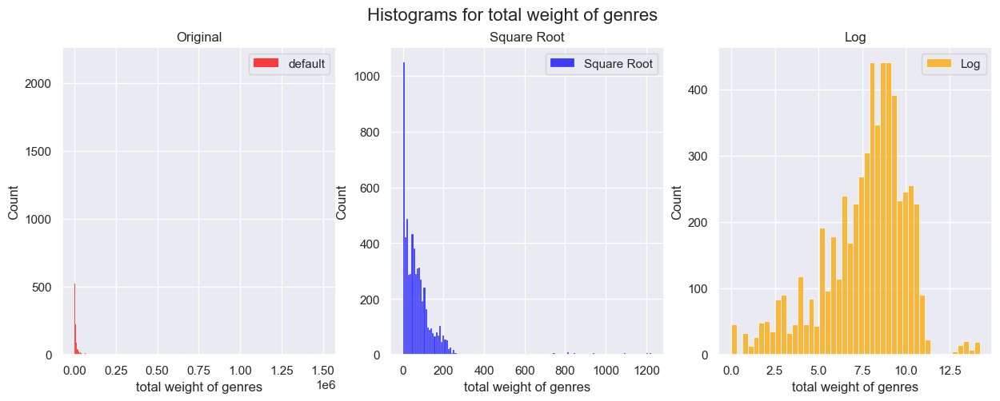

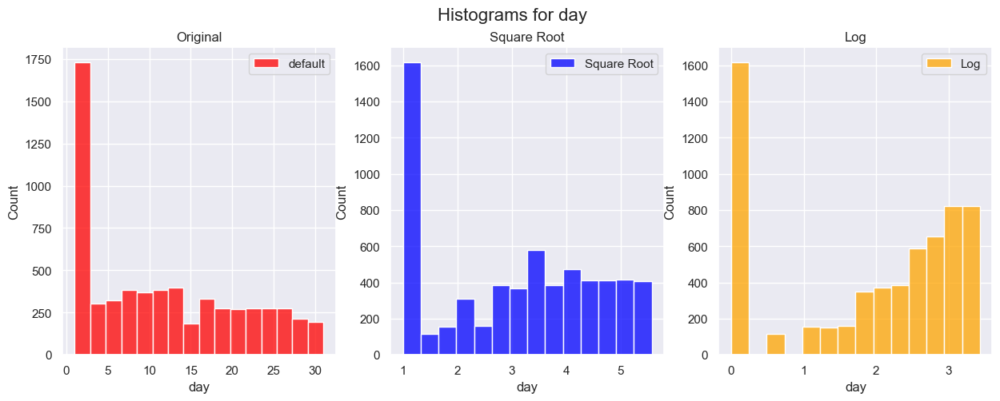

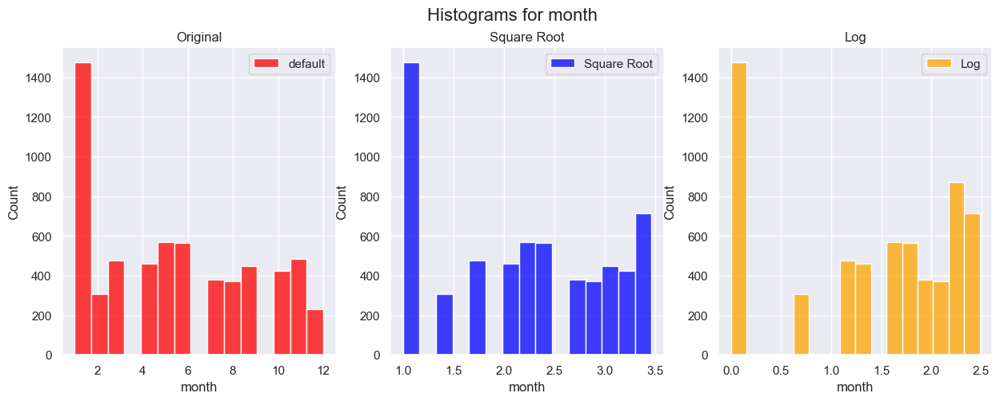

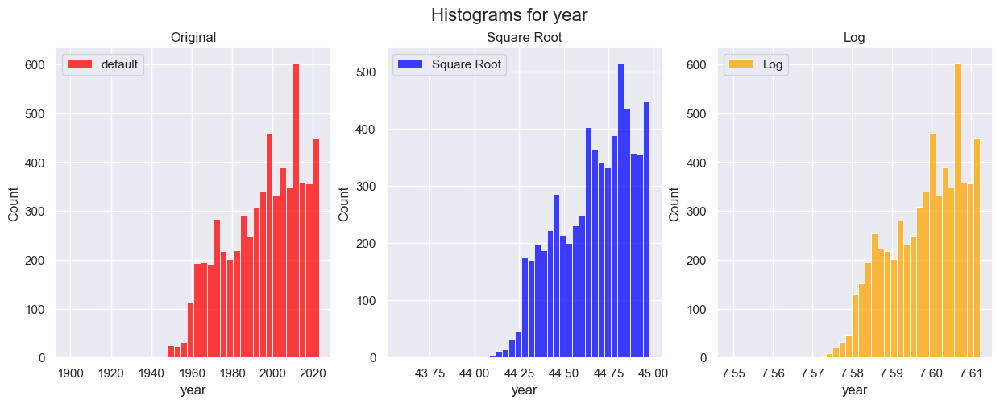

In [14]:
for col in non_object_cols:
    fig, ax = plt.subplots(1,3,figsize=(15, 5)) 
    fig.suptitle(f"Histograms for {col}", fontsize=16)

    sns.histplot(df[col], ax=ax[0], color='red', label='default')
    ax[0].set_title('Original')

    sns.histplot(np.sqrt(df[col]), ax=ax[1], color='blue', label='Square Root')
    ax[1].set_title('Square Root')

    sns.histplot(np.log(df[col]), ax=ax[2], color='orange', label='Log')
    ax[2].set_title('Log')

    for axis in ax:
        axis.legend()

plt.show()

<AxesSubplot: >

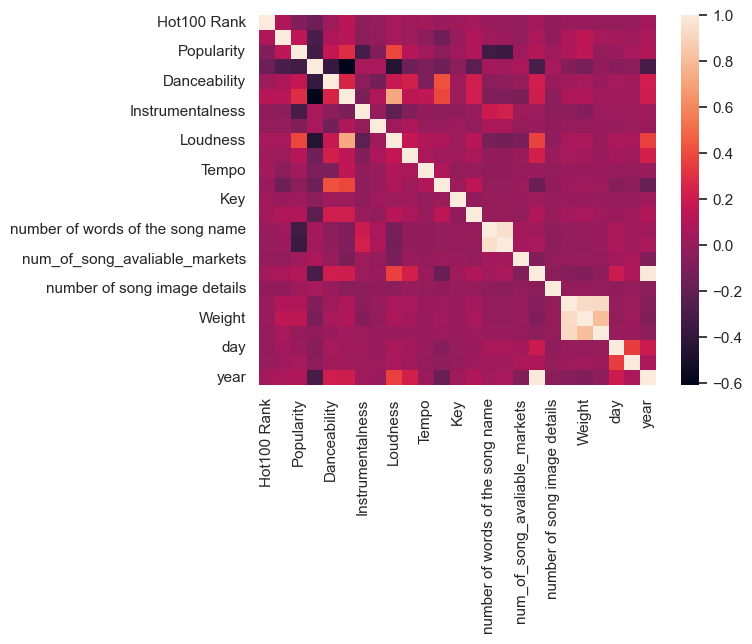

In [15]:
sns.heatmap(df[non_object_cols].corr())

<AxesSubplot: xlabel='Correlation', ylabel='Feature'>

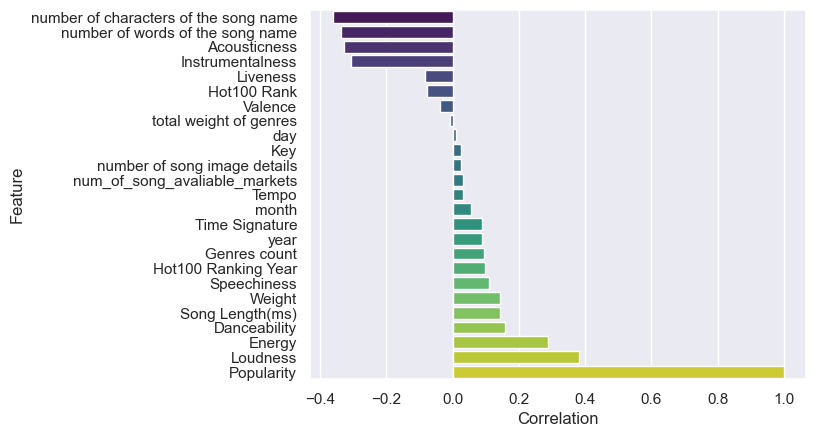

In [16]:
correlation_df = pd.DataFrame(list(df[non_object_cols].corr()["Popularity"].sort_values().items()), columns=['Feature', 'Correlation'])
sns.barplot(x='Correlation', y='Feature', data=correlation_df, palette='viridis')

<AxesSubplot: >

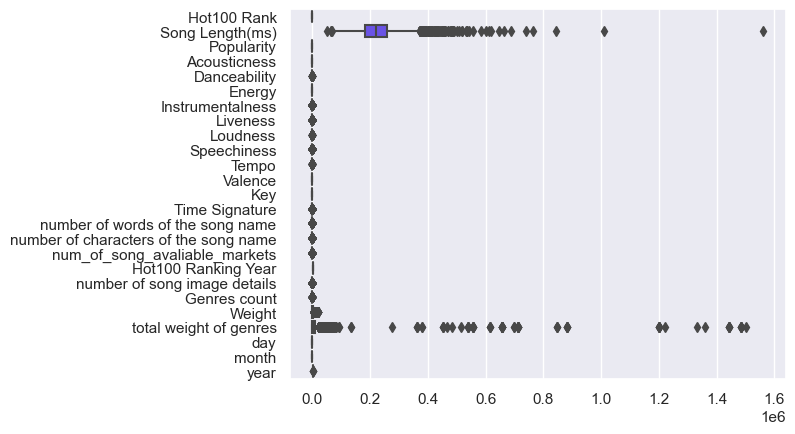

In [17]:
sns.boxplot(data=df[non_object_cols],palette='rainbow',orient='h')

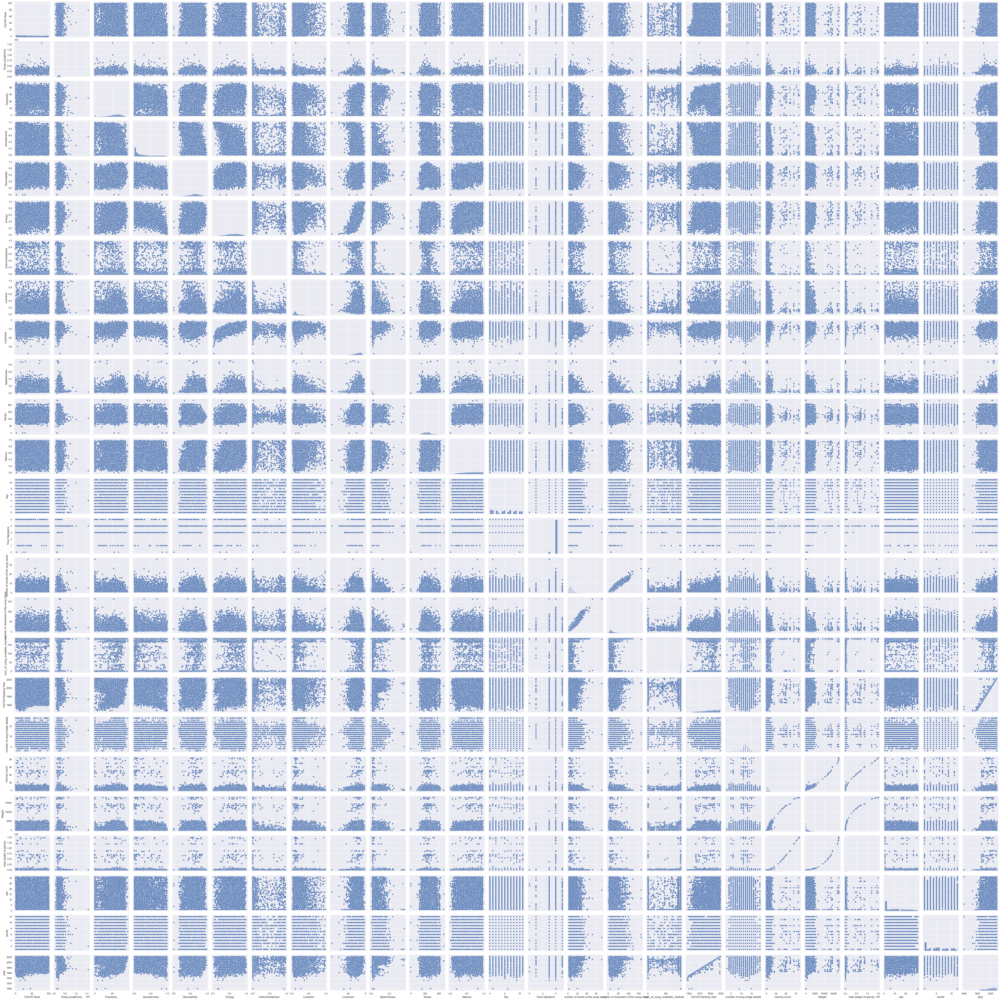

In [18]:
sns.pairplot(df[non_object_cols])

In [19]:
def check_Percentage_Of_Outliers(DataFrame,column_name,ifRemove=False):
    rows=DataFrame.shape[0]
    
    q1=DataFrame[column_name].quantile(0.25)
    q2=DataFrame[column_name].quantile(0.5) # Median
    q3=DataFrame[column_name].quantile(0.75)
    
    IQR=q3-q1
    cut_off = IQR * 1.5
    lower,upper= q1 - cut_off, q3 + cut_off
    
    outliers_count=DataFrame[column_name][(DataFrame[column_name] < lower)].count()
    outliers_count+=DataFrame[column_name][(DataFrame[column_name] > upper)].count()
    if not ifRemove:
        print(f"Name = {column_name} , Percentage = {outliers_count/rows: 0.3%} , Count = {outliers_count}")
    if ifRemove :
        DataFrame[column_name]=DataFrame[column_name][(DataFrame[column_name] > lower)]
        DataFrame[column_name]=DataFrame[column_name][(DataFrame[column_name] < upper)]

Name = Hot100 Rank , Percentage =  0.000% , Count = 0
--------------------

Name = Song Length(ms) , Percentage =  1.890% , Count = 117
--------------------

Name = Popularity , Percentage =  0.000% , Count = 0
--------------------

Name = Acousticness , Percentage =  0.000% , Count = 0
--------------------

Name = Danceability , Percentage =  0.662% , Count = 41
--------------------

Name = Energy , Percentage =  0.000% , Count = 0
--------------------

Name = Instrumentalness , Percentage =  20.934% , Count = 1296
--------------------

Name = Liveness , Percentage =  5.621% , Count = 348
--------------------

Name = Loudness , Percentage =  0.985% , Count = 61
--------------------

Name = Speechiness , Percentage =  13.213% , Count = 818
--------------------

Name = Tempo , Percentage =  1.438% , Count = 89
--------------------

Name = Valence , Percentage =  0.000% , Count = 0
--------------------

Name = Key , Percentage =  0.000% , Count = 0
--------------------

Name = Time Signa

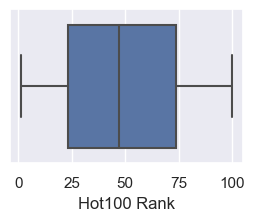

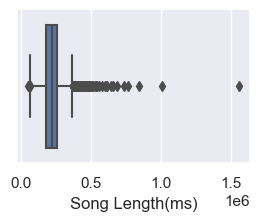

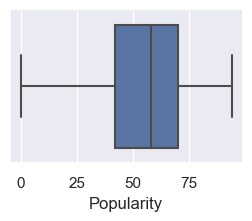

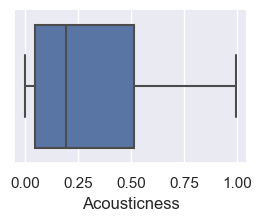

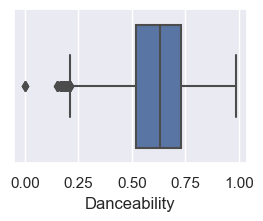

...

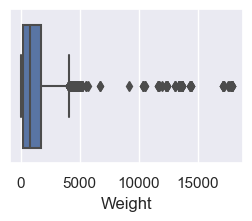

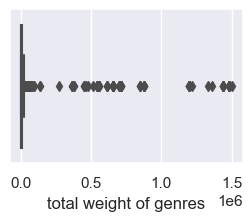

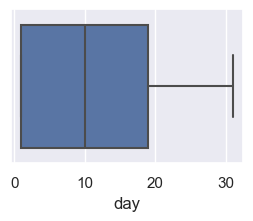

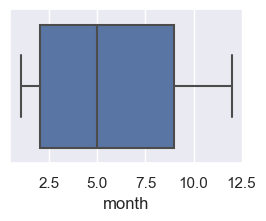

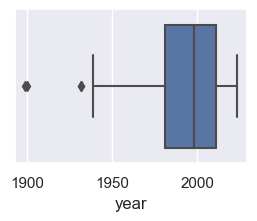

In [20]:
for col in non_object_cols:
    plt.figure(figsize=(3, 2))
    sns.boxplot(x=df[col])
    check_Percentage_Of_Outliers(df,col)
    print("--------------------\n")

In [21]:
epsilon = 1e-8
def safe_log(x):
    return np.log(x + epsilon)
transformations = [
    None,
    np.log,
    None,
    np.sqrt,
    None,
    None,
    np.log,
    np.log,
    None,
    np.log,
    None,
    None,
    None,
    None,
    np.log,
    np.log,
    None,
    None,
    None,
    np.log,
    np.log,
    np.log,
    None,
    None,
    None,
]
transformations=[safe_log if func == np.log else func for func in transformations]

In [22]:
NewDF=pd.DataFrame()

In [23]:
for (transformation,col) in zip(transformations,non_object_cols):
    if col=="Loudness":
        NewDF[col]=df[col]
    if transformation!=None:
        NewDF[transformation.__name__+" "+col]=transformation(df[col])
    else :
        NewDF[col]=df[col]

In [24]:
NewDF

,Hot100 Rank,safe_log Song Length(ms),Popularity,sqrt Acousticness,Danceability,Energy,safe_log Instrumentalness,safe_log Liveness,Loudness,safe_log Speechiness,...,safe_log number of characters of the song name,num_of_song_avaliable_markets,Hot100 Ranking Year,number of song image details,safe_log Genres count,safe_log Weight,safe_log total weight of genres,day,month,year
0,44,12.345078,62,0.141421,0.478,0.736,-9.253143,-2.137071,-7.124,-3.304978,...,2.302585,185,2001,14,1.386294e+00,6.169611,7.555905,30,1,2001
1,43,12.579703,63,0.482701,0.588,0.522,-18.420681,-1.427116,-6.254,-3.262305,...,2.302585,184,1999,10,1.386294e+00,7.448916,8.835210,31,8,1998
2,86,12.193256,49,0.689928,0.313,0.600,-10.572528,-0.648174,-7.913,-3.332604,...,3.637586,185,1979,14,1.000000e-08,3.850148,3.850148,14,4,1979
3,20,12.038044,43,0.986408,0.503,0.059,-18.420681,-2.273026,-16.131,-3.001750,...,3.806662,185,1954,7,1.609438e+00,6.200509,7.809947,8,2,1945
4,50,12.433260,0,0.122066,0.843,0.348,-6.660887,-1.398367,-10.669,-2.909554,...,3.988984,182,2011,16,1.000000e-08,5.176150,5.176150,16,8,2011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6186,88,12.607165,56,0.107703,0.875,0.862,-8.177120,-2.721135,-7.694,-2.780621,...,2.484907,185,1991,13,1.386294e+00,4.330733,5.717028,9,4,1990
6187,8,12.621663,71,0.434741,0.787,0.799,-18.420681,-1.203973,-4.680,-2.309610,...,1.791759,103,2006,12,1.386294e+00,6.391917,7.778211,1,1,2005
6188,43,12.353915,60,0.511859,0.684,0.819,-6.229717,-2.180367,-3.309,-1.435485,...,3.931826,185,2006,11,6.931472e-01,4.025352,4.718499,21,11,2005
6189,7,12.463911,75,0.144222,0.583,0.786,-18.420681,-1.671313,-3.142,-3.503230,...,2.197225,185,2008,12,1.945910e+00,5.918894,7.864804,3,7,2007


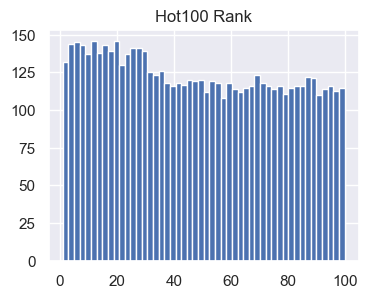

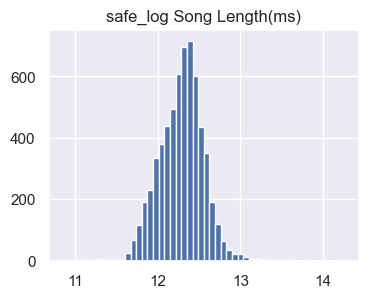

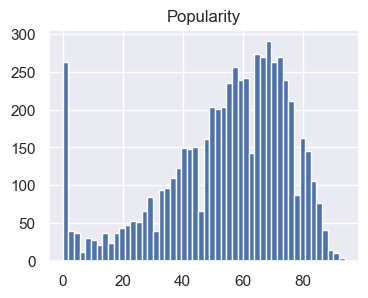

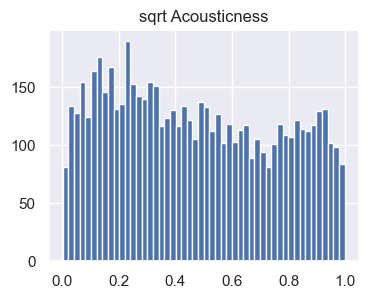

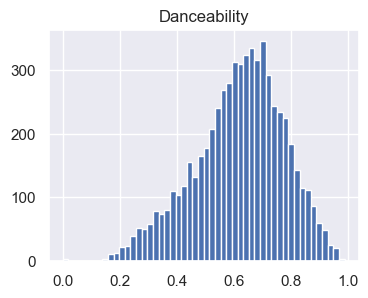

...

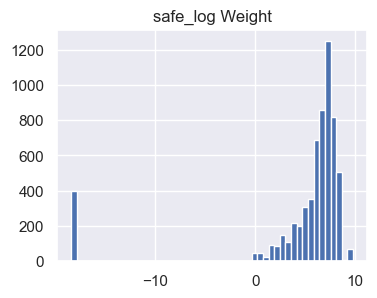

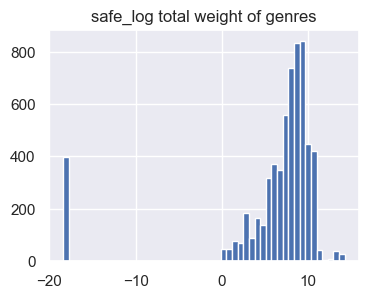

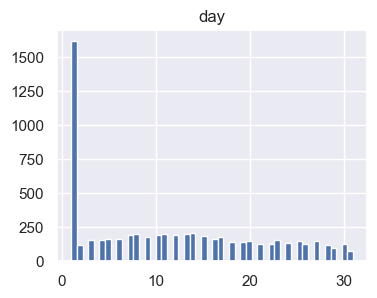

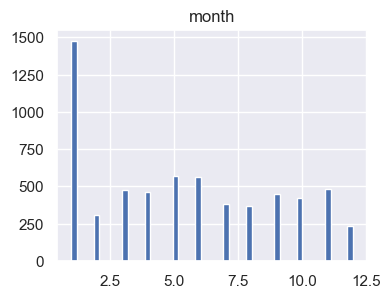

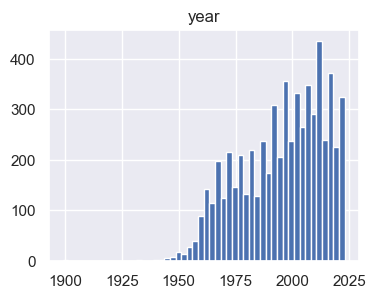

In [25]:
for col in NewDF.columns:
    fig = plt.figure(figsize=(4,3))
    plt.title(f"{col}")
    NewDF[col].hist(bins=50)

In [26]:
NewDF.corr()["Popularity"].sort_values()

safe_log number of characters of the song name   -0.297093
sqrt Acousticness                                -0.294281
safe_log number of words of the song name        -0.276182
safe_log Instrumentalness                        -0.246479
Hot100 Rank                                      -0.075731
safe_log Liveness                                -0.066159
Valence                                          -0.039074
day                                               0.011626
Key                                               0.025431
number of song image details                      0.025608
num_of_song_avaliable_markets                     0.031171
Tempo                                             0.032773
month                                             0.055949
Time Signature                                    0.087910
year                                              0.088246
Hot100 Ranking Year                               0.097407
safe_log Speechiness                              0.1173

Name = Hot100 Rank , Percentage =  0.000% , Count = 0
--------------------

Name = safe_log Song Length(ms) , Percentage =  1.131% , Count = 70
--------------------

Name = Popularity , Percentage =  0.000% , Count = 0
--------------------

Name = sqrt Acousticness , Percentage =  0.000% , Count = 0
--------------------

Name = Danceability , Percentage =  0.662% , Count = 41
--------------------

Name = Energy , Percentage =  0.000% , Count = 0
--------------------

Name = safe_log Instrumentalness , Percentage =  0.000% , Count = 0
--------------------

Name = safe_log Liveness , Percentage =  0.081% , Count = 5
--------------------

Name = Loudness , Percentage =  0.985% , Count = 61
--------------------

Name = safe_log Speechiness , Percentage =  7.156% , Count = 443
--------------------

Name = Tempo , Percentage =  1.438% , Count = 89
--------------------

Name = Valence , Percentage =  0.000% , Count = 0
--------------------

Name = Key , Percentage =  0.000% , Count = 0
------

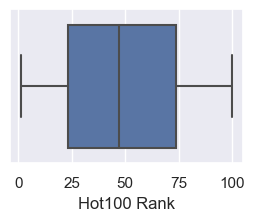

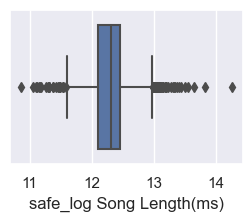

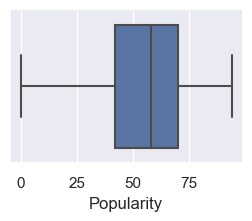

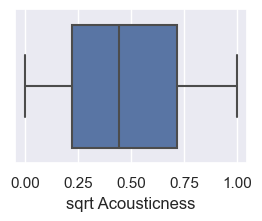

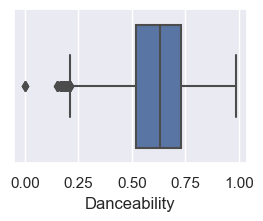

...

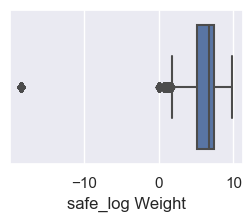

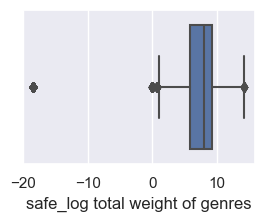

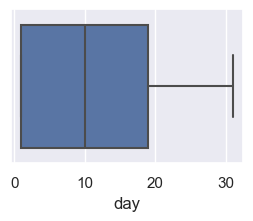

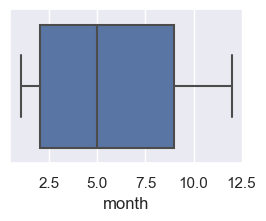

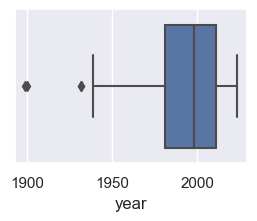

In [27]:
for col in NewDF.columns:
    plt.figure(figsize=(3, 2))
    sns.boxplot(x=NewDF[col])
    check_Percentage_Of_Outliers(NewDF,col)
    print("--------------------\n")

In [28]:
DFcategoricals=pd.get_dummies(df[categoricals]).astype(int)

In [29]:
NewDF

,Hot100 Rank,safe_log Song Length(ms),Popularity,sqrt Acousticness,Danceability,Energy,safe_log Instrumentalness,safe_log Liveness,Loudness,safe_log Speechiness,...,safe_log number of characters of the song name,num_of_song_avaliable_markets,Hot100 Ranking Year,number of song image details,safe_log Genres count,safe_log Weight,safe_log total weight of genres,day,month,year
0,44,12.345078,62,0.141421,0.478,0.736,-9.253143,-2.137071,-7.124,-3.304978,...,2.302585,185,2001,14,1.386294e+00,6.169611,7.555905,30,1,2001
1,43,12.579703,63,0.482701,0.588,0.522,-18.420681,-1.427116,-6.254,-3.262305,...,2.302585,184,1999,10,1.386294e+00,7.448916,8.835210,31,8,1998
2,86,12.193256,49,0.689928,0.313,0.600,-10.572528,-0.648174,-7.913,-3.332604,...,3.637586,185,1979,14,1.000000e-08,3.850148,3.850148,14,4,1979
3,20,12.038044,43,0.986408,0.503,0.059,-18.420681,-2.273026,-16.131,-3.001750,...,3.806662,185,1954,7,1.609438e+00,6.200509,7.809947,8,2,1945
4,50,12.433260,0,0.122066,0.843,0.348,-6.660887,-1.398367,-10.669,-2.909554,...,3.988984,182,2011,16,1.000000e-08,5.176150,5.176150,16,8,2011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6186,88,12.607165,56,0.107703,0.875,0.862,-8.177120,-2.721135,-7.694,-2.780621,...,2.484907,185,1991,13,1.386294e+00,4.330733,5.717028,9,4,1990
6187,8,12.621663,71,0.434741,0.787,0.799,-18.420681,-1.203973,-4.680,-2.309610,...,1.791759,103,2006,12,1.386294e+00,6.391917,7.778211,1,1,2005
6188,43,12.353915,60,0.511859,0.684,0.819,-6.229717,-2.180367,-3.309,-1.435485,...,3.931826,185,2006,11,6.931472e-01,4.025352,4.718499,21,11,2005
6189,7,12.463911,75,0.144222,0.583,0.786,-18.420681,-1.671313,-3.142,-3.503230,...,2.197225,185,2008,12,1.945910e+00,5.918894,7.864804,3,7,2007


In [30]:
DFcategoricals

,isItCatchy,is_colorful,has_Potential,fromTop1000Artist,Mode,Generes Clusters,Album_isTop_1810,Decade_Eighties,Decade_Fifties,Decade_Fourties,...,Decade_Sixties,Decade_Thirties,Decade_new millennium,Season_Autumn,Season_Spring,Season_Summer,Season_Winter,Duration Category_average_time,Duration Category_large_time,Duration Category_small_time
0,1,1,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,1,1,0,0
1,1,0,0,0,0,7,0,0,0,0,...,0,0,0,0,0,1,0,1,0,0
2,0,1,1,0,1,11,0,0,0,0,...,0,0,0,0,1,0,0,1,0,0
3,0,1,0,0,1,10,0,0,0,1,...,0,0,0,0,0,0,1,1,0,0
4,1,1,0,0,0,9,0,0,0,0,...,0,0,1,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6186,1,0,1,0,0,2,1,0,0,0,...,0,0,0,0,1,0,0,1,0,0
6187,1,1,0,0,0,17,0,0,0,0,...,0,0,1,0,0,0,1,1,0,0
6188,1,1,0,0,0,7,0,0,0,0,...,0,0,1,1,0,0,0,1,0,0
6189,1,1,0,1,0,2,0,0,0,0,...,0,0,1,0,0,1,0,1,0,0


In [31]:
PreprocessedDF=pd.DataFrame()

In [32]:
for i in NewDF.columns:
    PreprocessedDF[i]=NewDF[i]
for i in DFcategoricals.columns:
    PreprocessedDF[i]=DFcategoricals[i]

In [33]:
df["Artist(s) Genres"][df["Artist(s) Genres"].isnull()]="[]"

In [34]:
Genres=dict()
cnt=0
for row in df["Artist(s) Genres"]:
    set_ = ast.literal_eval(row)
    genres_list = [genre.strip() for genre in set_]
    for genre in genres_list:
        if genre not in Genres:
            Genres[genre]=cnt
            cnt=cnt+1

matrix=np.zeros((df.shape[0],728))

cnt=0
for i in df["Artist(s) Genres"]:
    set_ = ast.literal_eval(i)
    genres_list = [genre.strip() for genre in set_]
    for genre in genres_list:
        matrix[cnt,Genres[genre]]=1
    cnt=cnt+1

In [35]:
df=df.reset_index()
PreprocessedDF=PreprocessedDF.reset_index()

In [36]:
df[list(Genres.keys())]=pd.DataFrame(matrix,columns=list(Genres.keys()))
PreprocessedDF[list(Genres.keys())]=pd.DataFrame(matrix,columns=list(Genres.keys()))

In [37]:
df=df.drop(["index"],axis=1)

In [38]:
PreprocessedDF[['Song', 'Album', 'Artist Names']]=df[['Song', 'Album', 'Artist Names']]

In [39]:
PreprocessedDF[['Spotify Link', 'Song Image', 'Spotify URI']]=df[['Spotify Link', 'Song Image', 'Spotify URI']]

In [40]:
PreprocessedDF[["image_description","color_values"]]=df[["image_description","color_values"]]

In [41]:
PreprocessedDF

,index,Hot100 Rank,safe_log Song Length(ms),Popularity,sqrt Acousticness,Danceability,Energy,safe_log Instrumentalness,safe_log Liveness,Loudness,...,romanian pop,moldovan pop,Song,Album,Artist Names,Spotify Link,Song Image,Spotify URI,image_description,color_values
0,0,44,12.345078,62,0.141421,0.478,0.736,-9.253143,-2.137071,-7.124,...,0.0,0.0,I Need You,I Need You,['LeAnn Rimes'],https://open.spotify.com/track/046MBhhgQJJghnb...,https://i.scdn.co/image/ab67616d00001e025cf523...,spotify:track:046MBhhgQJJghnbgZCkaAR,a close up of a woman with a purple background...,"[(array([27, 27, 27], dtype=uint8), 674), (arr..."
1,1,43,12.579703,63,0.482701,0.588,0.522,-18.420681,-1.427116,-6.254,...,0.0,0.0,Sweet Lady,Tyrese,['Tyrese'],https://open.spotify.com/track/1Dx8rIZaXzZPvUQ...,https://i.scdn.co/image/ab67616d00001e0283422e...,spotify:track:1Dx8rIZaXzZPvUQRF2j9hB,arafise magazine cover with a man in a tank top,"[(array([195, 185, 193], dtype=uint8), 3756), ..."
2,2,86,12.193256,49,0.689928,0.313,0.600,-10.572528,-0.648174,-7.913,...,0.0,0.0,You Take My Breath Away - Mono Version,Sooner or Later,['Rex Smith'],https://open.spotify.com/track/3BCMsz55asr7Yr6...,https://i.scdn.co/image/ab67616d00001e02d1741c...,spotify:track:3BCMsz55asr7Yr6DqB9N8D,a close up of a person wearing a red shirt and...,"[(array([224, 91, 50], dtype=uint8), 904), (..."
3,3,20,12.038044,43,0.986408,0.503,0.059,-18.420681,-2.273026,-16.131,...,0.0,0.0,If I Give My Heart to You (with The Mellomen),Golden Girl (The Columbia Recordings 1944-1966),"['Doris Day', 'The Mellomen']",https://open.spotify.com/track/20G1XJaTwIm2Iuw...,https://i.scdn.co/image/ab67616d00001e02f2ee02...,spotify:track:20G1XJaTwIm2IuwA3Pjg1d,arafis day golden girl by doris day,"[(array([255, 255, 255], dtype=uint8), 3992), ..."
4,4,50,12.433260,0,0.122066,0.843,0.348,-6.660887,-1.398367,-10.669,...,0.0,0.0,Don't Forget About Us (As Made Famous By Maria...,Drew's Famous # 1 Karaoke Hits: Sing the Hits ...,['The Karaoke Crew'],https://open.spotify.com/track/28BSc2ZmO0Oe3iv...,https://i.scdn.co/image/ab67616d00001e02b0d3e3...,spotify:track:28BSc2ZmO0Oe3iv4mFdedS,a close up of a person singing into a micropho...,"[(array([ 0, 173, 239], dtype=uint8), 5433), ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6186,6186,88,12.607165,56,0.107703,0.875,0.862,-8.177120,-2.721135,-7.694,...,0.0,0.0,Strike It Up,Dreamland,['Black Box'],https://open.spotify.com/track/742hY2twqAjwNYn...,https://i.scdn.co/image/ab67616d00001e02ae03a8...,spotify:track:742hY2twqAjwNYnKkQdilj,a close up of a person in a black leather jack...,"[(array([14, 14, 14], dtype=uint8), 20695), (a..."
6187,6187,8,12.621663,71,0.434741,0.787,0.799,-18.420681,-1.203973,-4.680,...,0.0,0.0,Ridin',The Sound of Revenge,"['Chamillionaire', 'Krayzie Bone']",https://open.spotify.com/track/3kZoay4ANo86ehb...,https://i.scdn.co/image/ab67616d00001e02abeffe...,spotify:track:3kZoay4ANo86ehb6s4RwS9,a close up of a person wearing a hat and a hoodie,"[(array([255, 255, 255], dtype=uint8), 1537), ..."
6188,6188,43,12.353915,60,0.511859,0.684,0.819,-6.229717,-2.180367,-3.309,...,0.0,0.0,Where'd You Go (feat. Holly Brook & Jonah Matr...,The Rising Tied,"['Fort Minor', 'Holly Brook', 'Jonah Matranga']",https://open.spotify.com/track/7pAT4dOUzjq8Zia...,https://i.scdn.co/image/ab67616d00001e02063fc4...,spotify:track:7pAT4dOUzjq8Ziap5ShIqC,graffiti art of a bunch of cartoon characters ...,"[(array([235, 236, 231], dtype=uint8), 320), (..."
6189,6189,7,12.463911,75,0.144222,0.583,0.786,-18.420681,-1.671313,-3.142,...,0.0,0.0,Love Song,Little Voice,['Sara Bareilles'],https://open.spotify.com/track/4E6cwWJWZw2zWf7...,https://i.scdn.co/image/ab67616d00001e021c3e0a...,spotify:track:4E6cwWJWZw2zWf7VFbH7wf,arafed image of a woman holding a small radio ...,"[(array([255, 255, 255], dtype=uint8), 12415),..."


In [42]:
PreprocessedDF.to_csv("PreprocessedDF.csv")

In [43]:
df["is_local"].astype(int)
PreprocessedDF["is_local"]=df["is_local"]

In [44]:
PreprocessedDF[NewDF.columns]

,Hot100 Rank,safe_log Song Length(ms),Popularity,sqrt Acousticness,Danceability,Energy,safe_log Instrumentalness,safe_log Liveness,Loudness,safe_log Speechiness,...,safe_log number of characters of the song name,num_of_song_avaliable_markets,Hot100 Ranking Year,number of song image details,safe_log Genres count,safe_log Weight,safe_log total weight of genres,day,month,year
0,44,12.345078,62,0.141421,0.478,0.736,-9.253143,-2.137071,-7.124,-3.304978,...,2.302585,185,2001,14,1.386294e+00,6.169611,7.555905,30,1,2001
1,43,12.579703,63,0.482701,0.588,0.522,-18.420681,-1.427116,-6.254,-3.262305,...,2.302585,184,1999,10,1.386294e+00,7.448916,8.835210,31,8,1998
2,86,12.193256,49,0.689928,0.313,0.600,-10.572528,-0.648174,-7.913,-3.332604,...,3.637586,185,1979,14,1.000000e-08,3.850148,3.850148,14,4,1979
3,20,12.038044,43,0.986408,0.503,0.059,-18.420681,-2.273026,-16.131,-3.001750,...,3.806662,185,1954,7,1.609438e+00,6.200509,7.809947,8,2,1945
4,50,12.433260,0,0.122066,0.843,0.348,-6.660887,-1.398367,-10.669,-2.909554,...,3.988984,182,2011,16,1.000000e-08,5.176150,5.176150,16,8,2011
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6186,88,12.607165,56,0.107703,0.875,0.862,-8.177120,-2.721135,-7.694,-2.780621,...,2.484907,185,1991,13,1.386294e+00,4.330733,5.717028,9,4,1990
6187,8,12.621663,71,0.434741,0.787,0.799,-18.420681,-1.203973,-4.680,-2.309610,...,1.791759,103,2006,12,1.386294e+00,6.391917,7.778211,1,1,2005
6188,43,12.353915,60,0.511859,0.684,0.819,-6.229717,-2.180367,-3.309,-1.435485,...,3.931826,185,2006,11,6.931472e-01,4.025352,4.718499,21,11,2005
6189,7,12.463911,75,0.144222,0.583,0.786,-18.420681,-1.671313,-3.142,-3.503230,...,2.197225,185,2008,12,1.945910e+00,5.918894,7.864804,3,7,2007


In [45]:
def Replace_Outliers(DataFrame,column_name):
    rows=DataFrame.shape[0]
    
    q1=DataFrame[column_name].quantile(0.25)
    q2=DataFrame[column_name].quantile(0.5) # Median
    q3=DataFrame[column_name].quantile(0.75)
    
    IQR=q3-q1
    cut_off = IQR * 1.5
    lower,upper= q1 - cut_off, q3 + cut_off
    
    
    outliers = DataFrame[(DataFrame[column_name] < lower) | (DataFrame[column_name] > upper)][column_name]
    mean_value = DataFrame[column_name].mean()
    DataFrame.loc[outliers.index, column_name] = mean_value

In [46]:
PreprocessedDF2=pd.DataFrame(PreprocessedDF)

In [47]:
for col in NewDF.columns:
    Replace_Outliers(PreprocessedDF2,col)

Name = Hot100 Rank , Percentage =  0.000% , Count = 0
--------------------

Name = safe_log Song Length(ms) , Percentage =  0.129% , Count = 8
--------------------

Name = Popularity , Percentage =  0.000% , Count = 0
--------------------

Name = sqrt Acousticness , Percentage =  0.000% , Count = 0
--------------------

Name = Danceability , Percentage =  0.226% , Count = 14
--------------------

Name = Energy , Percentage =  0.000% , Count = 0
--------------------

Name = safe_log Instrumentalness , Percentage =  0.000% , Count = 0
--------------------

Name = safe_log Liveness , Percentage =  0.000% , Count = 0
--------------------

Name = Loudness , Percentage =  0.194% , Count = 12
--------------------

Name = safe_log Speechiness , Percentage =  5.556% , Count = 344
--------------------

Name = Tempo , Percentage =  0.468% , Count = 29
--------------------

Name = Valence , Percentage =  0.000% , Count = 0
--------------------

Name = Key , Percentage =  0.000% , Count = 0
-------

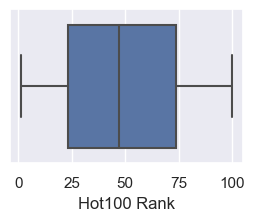

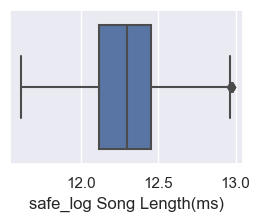

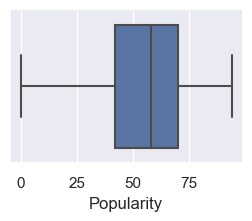

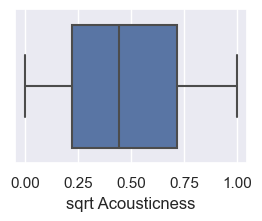

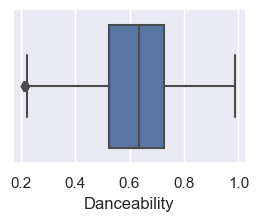

...

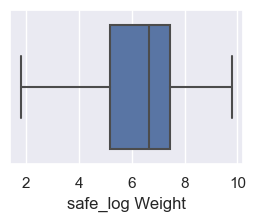

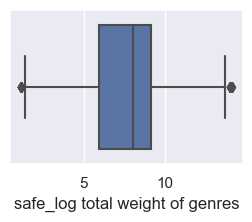

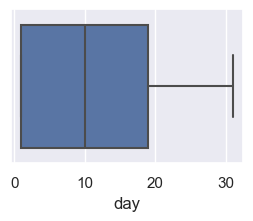

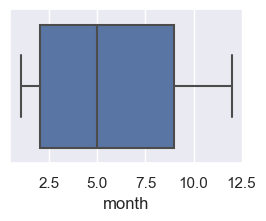

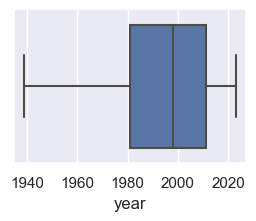

In [48]:
for col in NewDF.columns:
    plt.figure(figsize=(3, 2))
    sns.boxplot(x=PreprocessedDF2[col])
    check_Percentage_Of_Outliers(PreprocessedDF2,col)
    print("--------------------\n")

In [49]:
PreprocessedDF2.to_csv("PreprocessedDF_WithoutOutliers.csv")

In [ ]:
PreprocessedDF2=pd.read_csv()